In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import os
import gc
from pathlib import Path
import os

from sklearn.metrics import accuracy_score, f1_score, confusion_matrix
from IPython.display import FileLink, FileLinks

import fastai
from fastai import *
from fastai.vision import *
from fastai.callbacks import *

import PIL
from PIL import Image as PIL_IMG

import seaborn as sns

In [ ]:
import pretrainedmodels

In [187]:
print("Fastai version: ", fastai.__version__)
print("PIL version: ", PIL.__version__)
print("pretrainedmodels version: ", pretrainedmodels.__version__)

Fastai version:  1.0.51
PIL version:  5.1.0
pretrainedmodels version:  0.7.4


In [ ]:
DATA_DIR = Path('../input')
IMGS_PATH = Path('../input/images/images/')
SUB_DIR = Path('rnxt101_pr/')
SUB_DIR.mkdir(exist_ok=True)

In [188]:
[f for f in DATA_DIR.iterdir()]

[PosixPath('../input/train.csv'),
 PosixPath('../input/sample_submission.csv'),
 PosixPath('../input/images'),
 PosixPath('../input/test.csv')]

In [ ]:
train_df = pd.read_csv(DATA_DIR/'train.csv')
test_df = pd.read_csv(DATA_DIR/'test.csv')

In [ ]:
train_df['category'] = train_df['category'] + 1

In [ ]:
label_mapper = {1: 'Cargo', 
                2: 'Military', 
                3: 'Carrier', 
                4: 'Cruise', 
                5: 'Tankers'}

In [ ]:
label_mapper_c2i = {v:i for i, v in label_mapper.items()}

In [189]:
label_mapper_c2i

{'Cargo': 1, 'Military': 2, 'Carrier': 3, 'Cruise': 4, 'Tankers': 5}

In [ ]:
train_df['category'] = train_df['category'].map(label_mapper)

In [ ]:
train_df.head()

In [ ]:
train_df['category'].value_counts()

In [ ]:
def get_ex(path): return open_image(path)

def plots_f(path, tfms, rows, cols, width, height, **kwargs):
    [get_ex(path).apply_tfms(tfms[0], **kwargs).show(ax=ax) for i,ax in enumerate(plt.subplots(rows,cols,figsize=(width,height))[1].flatten())]

In [193]:
tfms = get_transforms(max_rotate=5, xtra_tfms=[])

In [194]:
tfms

([RandTransform(tfm=TfmCrop (crop_pad), kwargs={'row_pct': (0, 1), 'col_pct': (0, 1), 'padding_mode': 'reflection'}, p=1.0, resolved={}, do_run=True, is_random=True),
  RandTransform(tfm=TfmPixel (flip_lr), kwargs={}, p=0.5, resolved={}, do_run=True, is_random=True),
  RandTransform(tfm=TfmCoord (symmetric_warp), kwargs={'magnitude': (-0.2, 0.2)}, p=0.75, resolved={}, do_run=True, is_random=True),
  RandTransform(tfm=TfmAffine (rotate), kwargs={'degrees': (-5, 5)}, p=0.75, resolved={}, do_run=True, is_random=True),
  RandTransform(tfm=TfmAffine (zoom), kwargs={'scale': (1.0, 1.1), 'row_pct': (0, 1), 'col_pct': (0, 1)}, p=0.75, resolved={}, do_run=True, is_random=True),
  RandTransform(tfm=TfmLighting (brightness), kwargs={'change': (0.4, 0.6)}, p=0.75, resolved={}, do_run=True, is_random=True),
  RandTransform(tfm=TfmLighting (contrast), kwargs={'scale': (0.8, 1.25)}, p=0.75, resolved={}, do_run=True, is_random=True)],
 [RandTransform(tfm=TfmCrop (crop_pad), kwargs={}, p=1.0, resolved=

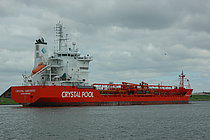

In [195]:
open_image(IMGS_PATH/'2816925.jpg')

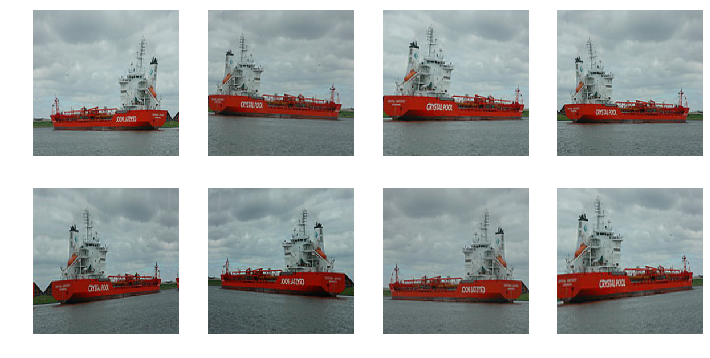

In [192]:
plots_f(IMGS_PATH/'2816925.jpg', tfms, 2, 4, 12, 6, size=(256, 256))
# plots_f(IMGS_PATH/'2816925.jpg', tfms, 2, 4, 12, 6, size=(140, 200), padding_mode='border', resize_method=ResizeMethod.PAD)

In [196]:
print(pretrainedmodels.model_names)

['fbresnet152', 'bninception', 'resnext101_32x4d', 'resnext101_64x4d', 'inceptionv4', 'inceptionresnetv2', 'alexnet', 'densenet121', 'densenet169', 'densenet201', 'densenet161', 'resnet18', 'resnet34', 'resnet50', 'resnet101', 'resnet152', 'inceptionv3', 'squeezenet1_0', 'squeezenet1_1', 'vgg11', 'vgg11_bn', 'vgg13', 'vgg13_bn', 'vgg16', 'vgg16_bn', 'vgg19_bn', 'vgg19', 'nasnetamobile', 'nasnetalarge', 'dpn68', 'dpn68b', 'dpn92', 'dpn98', 'dpn131', 'dpn107', 'xception', 'senet154', 'se_resnet50', 'se_resnet101', 'se_resnet152', 'se_resnext50_32x4d', 'se_resnext101_32x4d', 'cafferesnet101', 'pnasnet5large', 'polynet']


In [197]:
print(pretrainedmodels.pretrained_settings['resnext101_64x4d'])

{'imagenet': {'url': 'http://data.lip6.fr/cadene/pretrainedmodels/resnext101_64x4d-e77a0586.pth', 'input_space': 'RGB', 'input_size': [3, 224, 224], 'input_range': [0, 1], 'mean': [0.485, 0.456, 0.406], 'std': [0.229, 0.224, 0.225], 'num_classes': 1000}}


In [ ]:
train_il = ImageList.from_df(df=train_df, cols='image', path=IMGS_PATH)
test_il = ImageList.from_df(df=test_df, cols='image', path=IMGS_PATH)

In [ ]:
np.random.seed(0)
src1 = (train_il
        .split_from_df(col='valid')
        .label_from_df(cols='category')
        .add_test(test_il))

In [204]:
tfms1 = get_transforms(max_rotate=5, xtra_tfms=[cutout(p=0.5, n_holes=(1,4), length=(8,12))])
data1 = (src1
        .transform(tfms1, size=(128, 128))
        .databunch(path='.', bs=32)
        .normalize(imagenet_stats))

In [205]:
data1

ImageDataBunch;

Train: LabelList (5001 items)
x: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: CategoryList
Cargo,Cruise,Tankers,Carrier,Cargo
Path: ../input/images/images;

Valid: LabelList (1251 items)
x: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: CategoryList
Tankers,Cruise,Tankers,Cargo,Military
Path: ../input/images/images;

Test: LabelList (2680 items)
x: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: EmptyLabelList
,,,,
Path: ../input/images/images

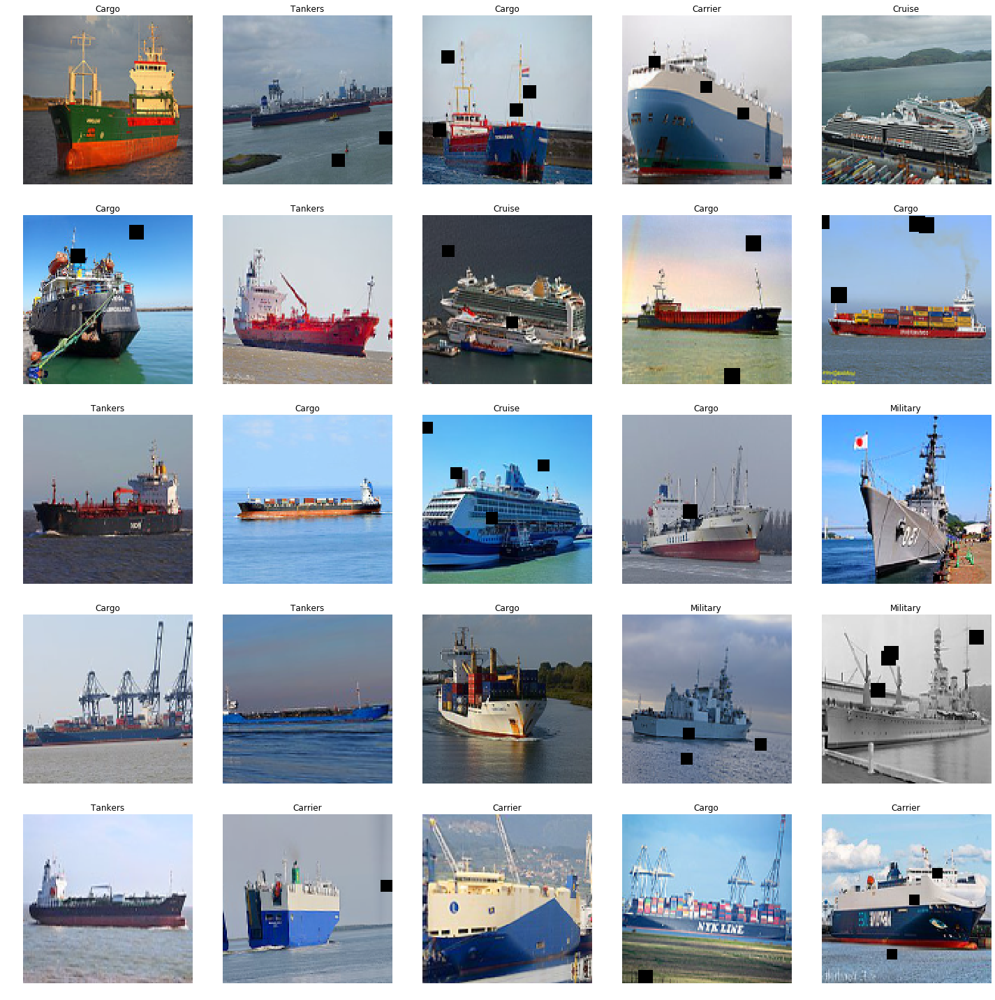

In [206]:
data1.show_batch()

In [207]:
def model_f(pretrained=True, **kwargs):
    return pretrainedmodels.__dict__['resnext101_64x4d'](num_classes=1000, pretrained='imagenet')

def getLearner(data):
    learn1 = cnn_learner(data, model_f, metrics=[accuracy, FBeta(average='weighted')])
    return learn1

In [208]:
learn1 = getLearner(data1)
# learn1 = cnn_learner(data1, models.densenet121, metrics=[accuracy, FBeta(average='weighted')])

In [ ]:
learn1.lr_find()

In [ ]:
learn1.recorder.plot()

In [209]:
rnxt101_stage1_im128_callbacks = [CSVLogger(learn=learn1, filename=SUB_DIR/'rnxt101_stage1_im128_history'), ShowGraph(learn=learn1)]

epoch,train_loss,valid_loss,accuracy,f_beta,time
0,0.879850,0.641941,0.743405,0.743387,00:50
1,0.588787,0.429643,0.839329,0.839051,00:46
2,0.427519,0.346109,0.874500,0.873862,00:46
3,0.333733,0.291611,0.889688,0.889815,00:46
4,0.274602,0.280028,0.896083,0.896154,00:46


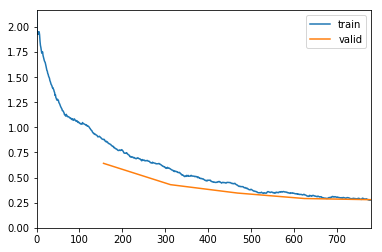

In [210]:
lr = (1e-2)/2
learn1.fit_one_cycle(5, slice(lr), callbacks=rnxt101_stage1_im128_callbacks)

In [214]:
learn1.save('rnxt101_stage1_im128')

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


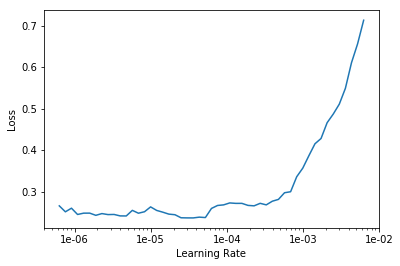

In [215]:
learn1.unfreeze()
learn1.lr_find()
learn1.recorder.plot()

In [217]:
rnxt101_stage2_im128_callbacks = [CSVLogger(learn=learn1, filename=SUB_DIR/'rnxt101_stage2_im128_history'), ShowGraph(learn=learn1)]

epoch,train_loss,valid_loss,accuracy,f_beta,time
0,0.264155,0.275734,0.899281,0.899161,01:04
1,0.225487,0.261859,0.898481,0.898268,01:03
2,0.225686,0.234674,0.920863,0.920763,01:03
3,0.159145,0.217847,0.916866,0.916911,01:03
4,0.132758,0.216343,0.923261,0.923316,01:04
5,0.106850,0.203327,0.922462,0.922549,01:03
6,0.089904,0.198038,0.930456,0.930323,01:03
7,0.077844,0.195400,0.926459,0.926549,01:03
8,0.082509,0.195358,0.927258,0.927282,01:04
9,0.066715,0.195544,0.926459,0.926467,01:03


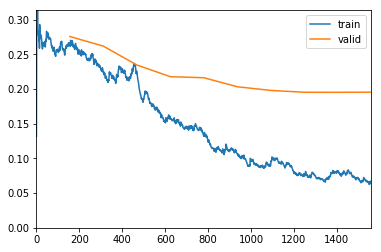

In [218]:
learn1.fit_one_cycle(10, slice((1e-5), 1e-4), callbacks=rnxt101_stage2_im128_callbacks)

In [219]:
learn1.save('rnxt101_stage2_im128')

In [220]:
from fastai.callbacks.hooks import *
import cv2
import matplotlib.pyplot as plt
import random

# hook into forward pass
def hooked_backward(m, oneBatch, cat):
    # we hook into the convolutional part = m[0] of the model
    with hook_output(m[0]) as hook_a: 
        with hook_output(m[0], grad=True) as hook_g:
            preds = m(oneBatch)
            preds[0,int(cat)].backward()
    return hook_a,hook_g

# We can create a utility function for getting a validation image with an activation map
def getHeatmap(val_index, learner, imgDataBunch):
    """Returns the validation set image and the activation map"""
    # this gets the model
    m = learner.model.eval()
    tensorImg,cl = imgDataBunch.valid_ds[val_index]
    # create a batch from the one image
    oneBatch,_ = imgDataBunch.one_item(tensorImg)
    oneBatch_im = vision.Image(imgDataBunch.denorm(oneBatch)[0])
    # convert batch tensor image to grayscale image with opencv
    cvIm = cv2.cvtColor(image2np(oneBatch_im.data), cv2.COLOR_RGB2GRAY)
    # attach hooks
    hook_a,hook_g = hooked_backward(m, oneBatch, cl)
    # get convolutional activations and average from channels
    acts = hook_a.stored[0].cpu()
    #avg_acts = acts.mean(0)

    # Grad-CAM
    grad = hook_g.stored[0][0].cpu()
    grad_chan = grad.mean(1).mean(1)
    grad.shape,grad_chan.shape
    mult = (acts*grad_chan[...,None,None]).mean(0)
    return mult, cvIm

# Then, modify our plotting func a bit
def plot_heatmap_overview(interp:ClassificationInterpretation, learner, imgDataBunch, classes=['Cargo', 'Carrier', 'Cruise', 'Military', 'Tankers']):
    # top losses will return all validation losses and indexes sorted by the largest first
    tl_val,tl_idx = interp.top_losses()
    #classes = interp.data.classes
    fig, ax = plt.subplots(3,4, figsize=(16,12))
    fig.suptitle('Grad-CAM\nPredicted / Actual / Loss / Probability',fontsize=20)
    # Random
    for i in range(4):
        random_index = random.randint(0,len(tl_idx))
        idx = tl_idx[random_index]
        act, im = getHeatmap(idx, learner, imgDataBunch)
        H,W = im.shape
        _,cl = interp.data.dl(DatasetType.Valid).dataset[idx]
        cl = int(cl)
        ax[0,i].imshow(im)
        ax[0,i].imshow(im, cmap=plt.cm.gray)
        ax[0,i].imshow(act, alpha=0.5, extent=(0,H,W,0),
              interpolation='bilinear', cmap='inferno')
        ax[0,i].set_xticks([])
        ax[0,i].set_yticks([])
        ax[0,i].set_title(f'{classes[interp.pred_class[idx]]} / {classes[cl]} / {interp.losses[idx]:.2f} / {interp.probs[idx][cl]:.2f}')
    ax[0,0].set_ylabel('Random samples', fontsize=16, rotation=0, labelpad=80)
    # Most incorrect or top losses
    for i in range(4):
        idx = tl_idx[i]
        act, im = getHeatmap(idx, learner, imgDataBunch)
        H,W = im.shape
        _,cl = interp.data.dl(DatasetType.Valid).dataset[idx]
        cl = int(cl)
        ax[1,i].imshow(im)
        ax[1,i].imshow(im, cmap=plt.cm.gray)
        ax[1,i].imshow(act, alpha=0.5, extent=(0,H,W,0),
              interpolation='bilinear', cmap='inferno')
        ax[1,i].set_xticks([])
        ax[1,i].set_yticks([])
        ax[1,i].set_title(f'{classes[interp.pred_class[idx]]} / {classes[cl]} / {interp.losses[idx]:.2f} / {interp.probs[idx][cl]:.2f}')
    ax[1,0].set_ylabel('Most incorrect\nsamples', fontsize=16, rotation=0, labelpad=80)
    # Most correct or least losses
    for i in range(4):
        idx = tl_idx[len(tl_idx) - i - 1]
        act, im = getHeatmap(idx, learner, imgDataBunch)
        H,W = im.shape
        _,cl = interp.data.dl(DatasetType.Valid).dataset[idx]
        cl = int(cl)
        ax[2,i].imshow(im)
        ax[2,i].imshow(im, cmap=plt.cm.gray)
        ax[2,i].imshow(act, alpha=0.5, extent=(0,H,W,0),
              interpolation='bilinear', cmap='inferno')
        ax[2,i].set_xticks([])
        ax[2,i].set_yticks([])
        ax[2,i].set_title(f'{classes[interp.pred_class[idx]]} / {classes[cl]} / {interp.losses[idx]:.2f} / {interp.probs[idx][cl]:.2f}')
    ax[2,0].set_ylabel('Most correct\nsamples', fontsize=16, rotation=0, labelpad=80)

In [221]:
interp = ClassificationInterpretation.from_learner(learn1)

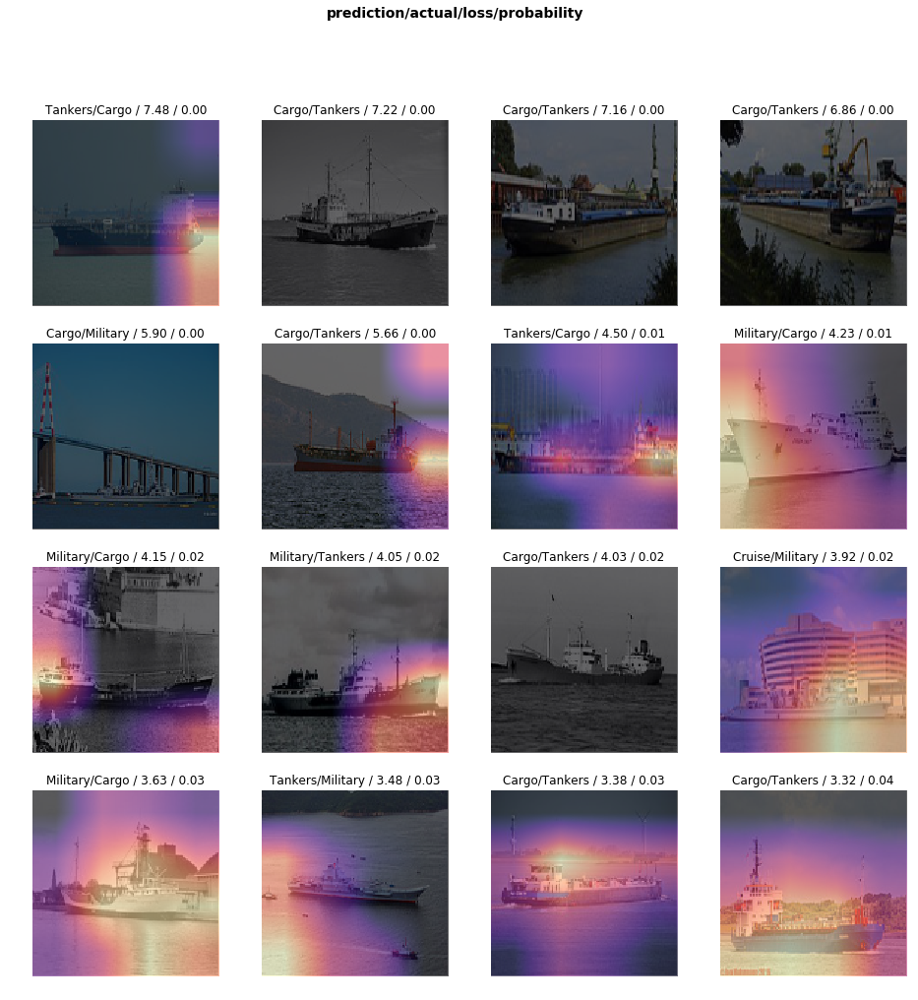

In [225]:
interp.plot_top_losses(16, figsize=(16,16))

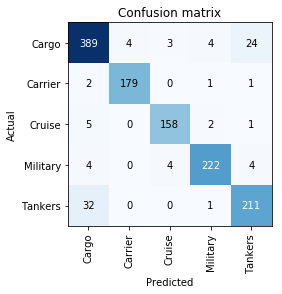

In [226]:
interp.plot_confusion_matrix()

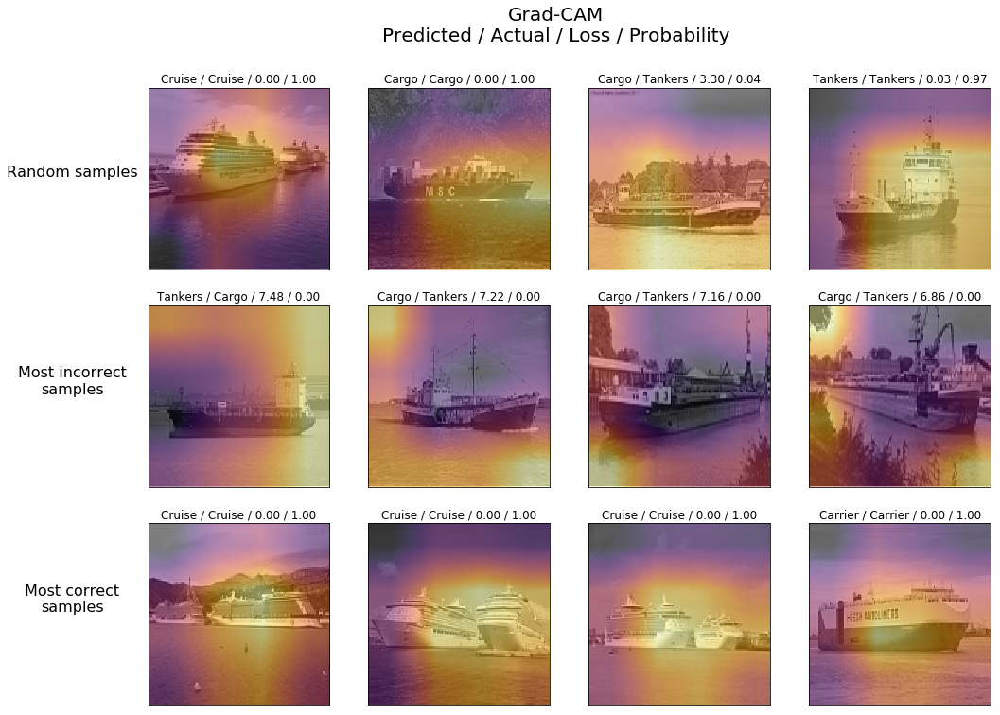

In [227]:
plot_heatmap_overview(interp, learn1, data1)

For 2nd image resolution images

In [235]:
torch.cuda.empty_cache()
!nvidia-smi

Sun Jun  9 15:20:02 2019       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 410.104      Driver Version: 410.104      CUDA Version: 10.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  On   | 00000000:00:04.0 Off |                    0 |
| N/A   49C    P0    35W / 250W |   2327MiB / 16280MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

In [236]:
data1 = (src1
        .transform(tfms1, size=(200, 200))
        .databunch(path='.', bs=32)
        .normalize(imagenet_stats))

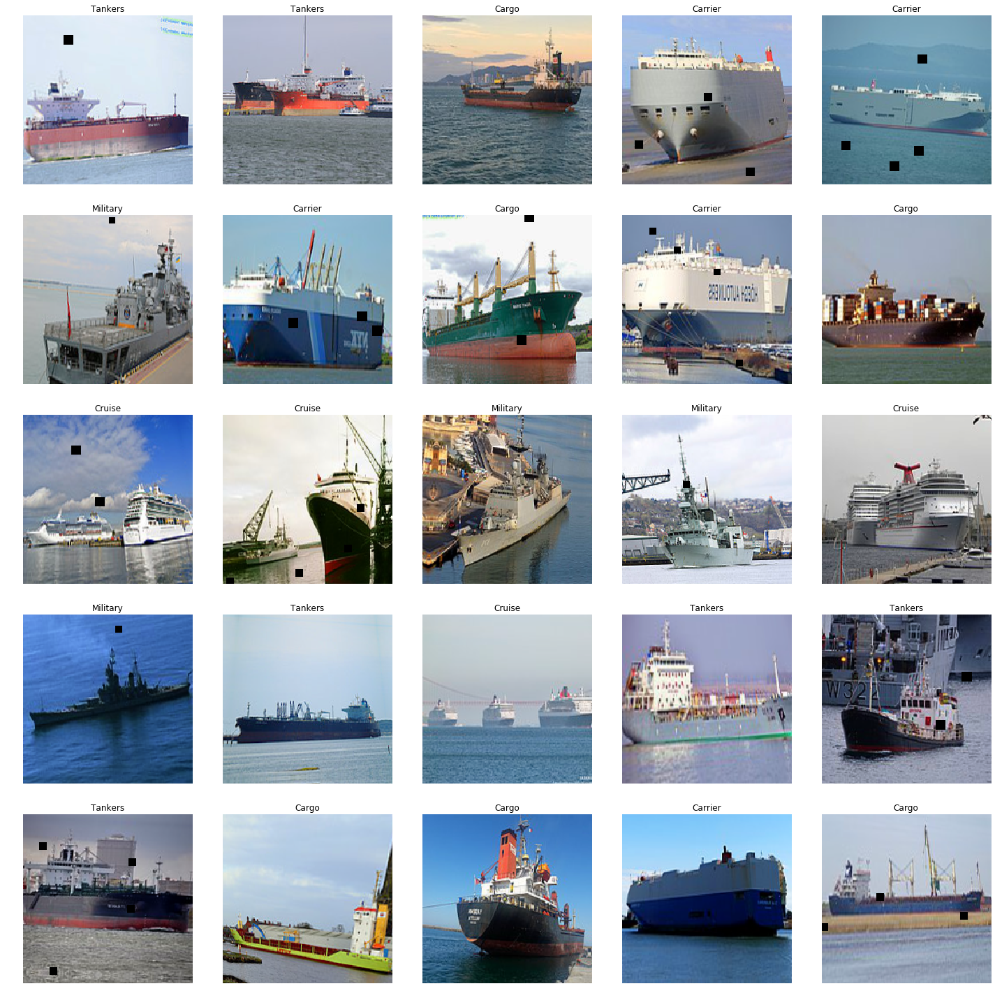

In [237]:
data1.show_batch()

In [238]:
learn1.data = data1

In [239]:
learn1.data

ImageDataBunch;

Train: LabelList (5001 items)
x: ImageList
Image (3, 200, 200),Image (3, 200, 200),Image (3, 200, 200),Image (3, 200, 200),Image (3, 200, 200)
y: CategoryList
Cargo,Cruise,Tankers,Carrier,Cargo
Path: ../input/images/images;

Valid: LabelList (1251 items)
x: ImageList
Image (3, 200, 200),Image (3, 200, 200),Image (3, 200, 200),Image (3, 200, 200),Image (3, 200, 200)
y: CategoryList
Tankers,Cruise,Tankers,Cargo,Military
Path: ../input/images/images;

Test: LabelList (2680 items)
x: ImageList
Image (3, 200, 200),Image (3, 200, 200),Image (3, 200, 200),Image (3, 200, 200),Image (3, 200, 200)
y: EmptyLabelList
,,,,
Path: ../input/images/images

In [241]:
learn1.freeze()
learn1.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


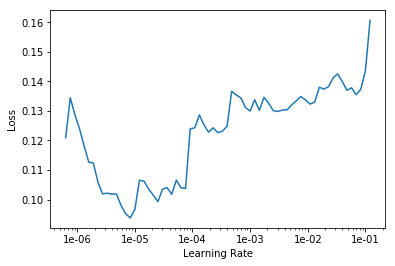

In [242]:
learn1.recorder.plot()

epoch,train_loss,valid_loss,accuracy,f_beta,time
0,0.123857,0.175575,0.941647,0.941626,01:22
1,0.131193,0.202595,0.918465,0.918231,01:20
2,0.126958,0.233567,0.928058,0.927886,01:20
3,0.127818,0.238542,0.931255,0.930747,01:20
4,0.114078,0.214564,0.929656,0.929336,01:20
5,0.073241,0.206765,0.944844,0.944758,01:20
6,0.068088,0.189745,0.949640,0.949655,01:20
7,0.046492,0.188525,0.952838,0.952763,01:20
8,0.034767,0.195643,0.957634,0.957638,01:20
9,0.023628,0.195871,0.955236,0.955219,01:20


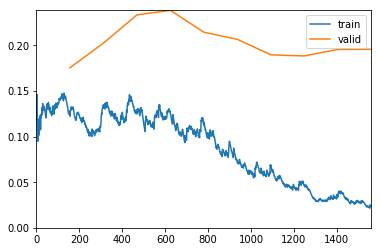

In [243]:
rnxt101_stage1_im256_callbacks = [CSVLogger(learn=learn1, filename=SUB_DIR/'rnxt101_stage1_im256_history'), ShowGraph(learn=learn1)]
lr = (1e-2)/2
learn1.fit_one_cycle(10, slice(lr), callbacks=rnxt101_stage1_im256_callbacks)

In [244]:
learn1.save('rnxt101_stage1_im200')

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


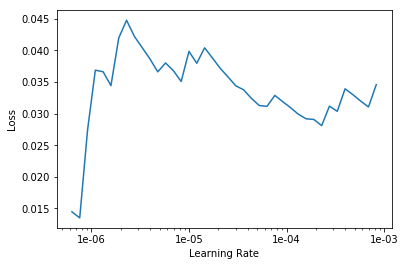

In [245]:
learn1.unfreeze()
learn1.lr_find()
learn1.recorder.plot()

epoch,train_loss,valid_loss,accuracy,f_beta,time
0,0.019235,0.194828,0.960032,0.960030,01:57
1,0.022867,0.195070,0.953637,0.953566,01:57
2,0.029244,0.191680,0.960032,0.960034,01:57
3,0.023786,0.196991,0.960032,0.960057,01:57
4,0.020355,0.231934,0.951239,0.951191,01:57
5,0.023493,0.196560,0.957634,0.957619,01:57
6,0.024629,0.217989,0.953637,0.953650,01:57
7,0.023421,0.188417,0.960032,0.960016,01:57
8,0.026601,0.209436,0.952838,0.952636,01:57
9,0.017771,0.181116,0.961631,0.961592,01:57


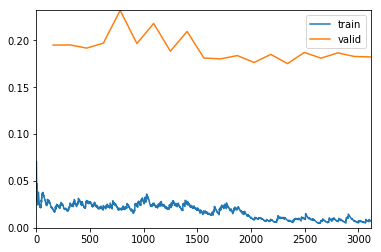

In [246]:
rnxt101_stage2_im200_callbacks = [CSVLogger(learn=learn1, filename=SUB_DIR/'rnxt101_stage2_im200_history'), ShowGraph(learn=learn1)]
learn1.fit_one_cycle(20, slice((1e-5), (1e-4)), callbacks=rnxt101_stage2_im200_callbacks)

In [247]:
learn1.save('rnxt101_stage2_im200')

In [248]:
interp2 = ClassificationInterpretation.from_learner(learn1)

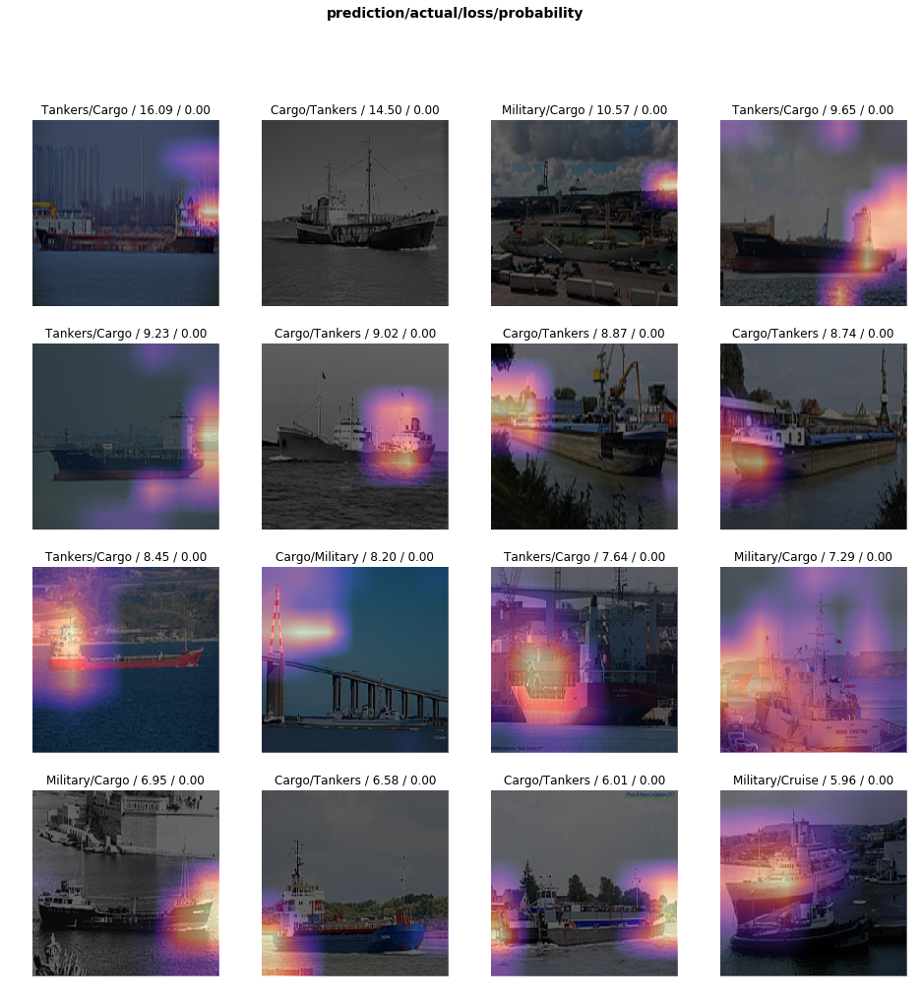

In [249]:
interp2.plot_top_losses(16, figsize=(16,16))

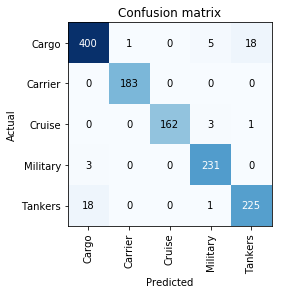

In [250]:
interp2.plot_confusion_matrix()

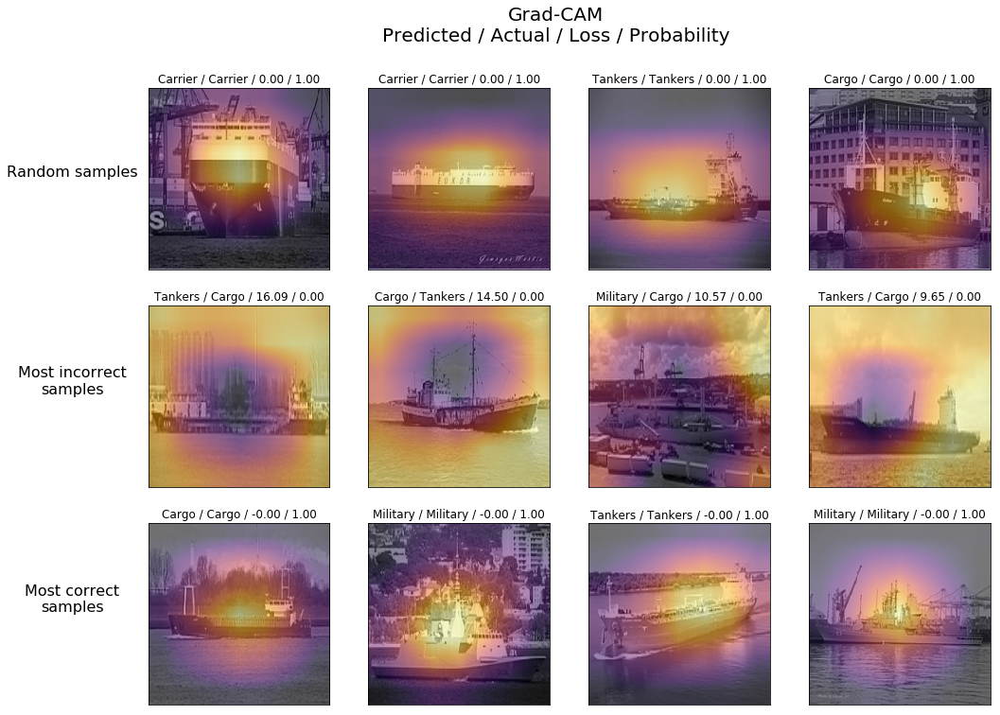

In [252]:
plot_heatmap_overview(interp2, learn1, data1)

In [253]:
interp2_tta = ClassificationInterpretation.from_learner(learn1, tta=True)

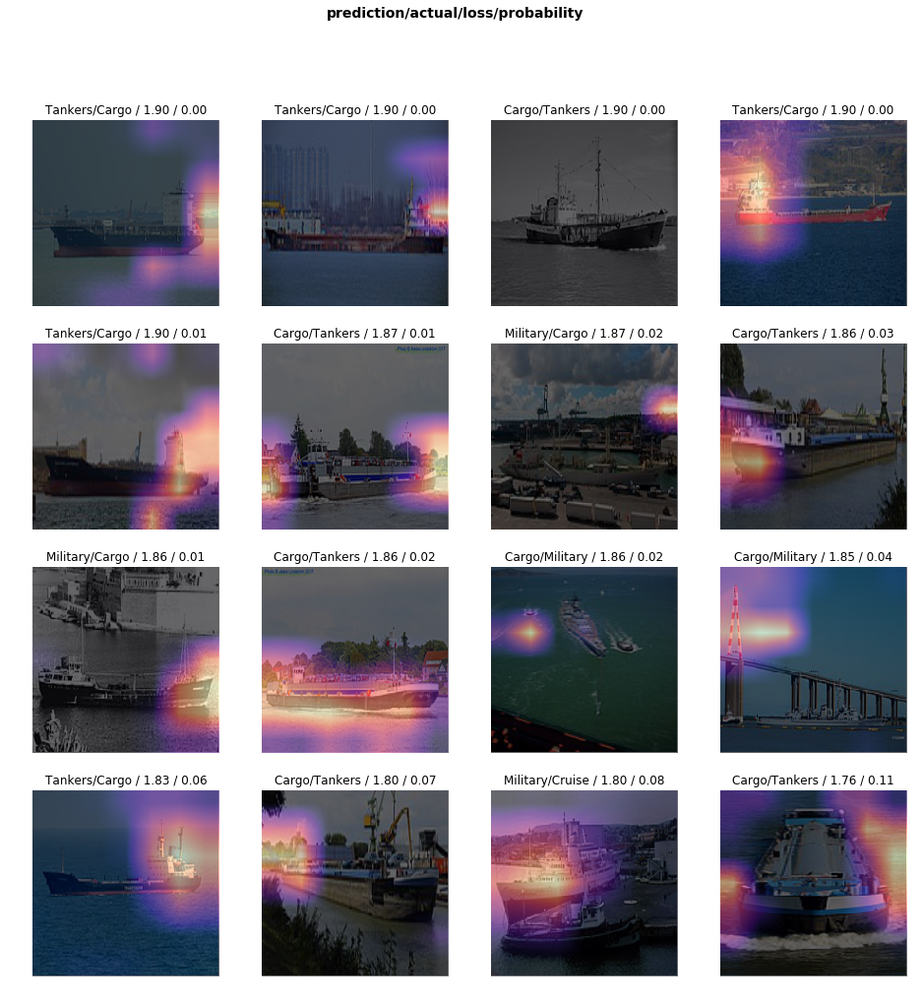

In [254]:
interp2_tta.plot_top_losses(16, figsize=(16,16))

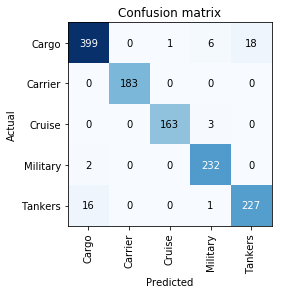

In [257]:
interp2_tta.plot_confusion_matrix()

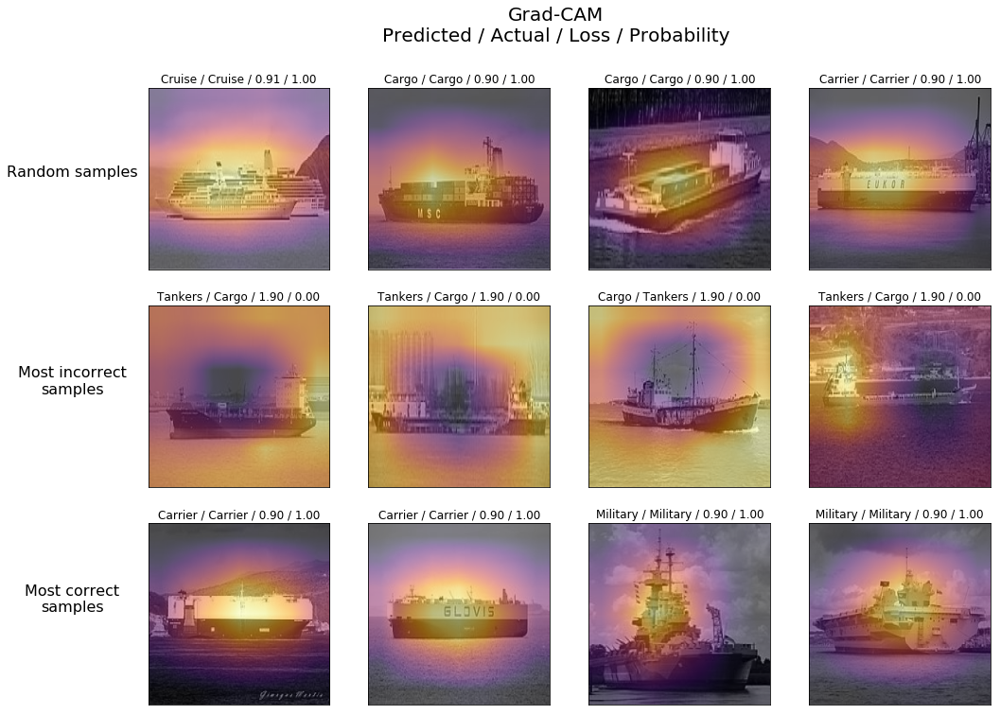

In [258]:
plot_heatmap_overview(interp2_tta, learn1, data1)

In [259]:
fast_i2c = {v:i for i, v in learn1.data.train_ds.y.c2i.items()}

In [260]:
fast_i2c

{0: 'Cargo', 1: 'Carrier', 2: 'Cruise', 3: 'Military', 4: 'Tankers'}

In [261]:
val_preds_tta = learn1.TTA(ds_type=DatasetType.Valid)

In [262]:
accuracy_score(y_pred=val_preds_tta[0].argmax(1).numpy(), y_true=val_preds_tta[1].numpy())

0.9640287769784173

In [263]:
f1_score(y_pred=val_preds_tta[0].argmax(1).numpy(), y_true=val_preds_tta[1].numpy(), average='weighted')

0.9640335178866881

In [264]:
val_preds = learn1.get_preds()

In [265]:
accuracy_score(y_pred=val_preds[0].argmax(1).numpy(), y_true=val_preds[1].numpy())

0.9600319744204636

In [266]:
f1_score(y_pred=val_preds[0].argmax(1).numpy(), y_true=val_preds[1].numpy(), average='weighted')

0.9600104235525193

In [267]:
target_cls = learn1.data.train_ds.y.classes
target_cls

['Cargo', 'Carrier', 'Cruise', 'Military', 'Tankers']

In [268]:
valid_img_names = [Path(i).name for i in learn1.data.valid_ds.x.items]

In [269]:
valid_prob_tta_df = pd.DataFrame(val_preds_tta[0].numpy(), columns=target_cls)
valid_prob_tta_df['image'] = valid_img_names

In [270]:
valid_prob_df = pd.DataFrame(val_preds[0].numpy(), columns=target_cls)
valid_prob_df['image'] = valid_img_names

In [271]:
train_preds_tta = learn1.TTA(ds_type=DatasetType.Train)

In [272]:
accuracy_score(y_pred=train_preds_tta[0].argmax(1).numpy(), y_true=train_preds_tta[1].numpy())

0.9911858974358975

In [273]:
f1_score(y_pred=train_preds_tta[0].argmax(1).numpy(), y_true=train_preds_tta[1].numpy(), average='weighted')

0.9912039331947253

In [274]:
train_preds = learn1.get_preds(ds_type=DatasetType.Train)

In [275]:
accuracy_score(y_pred=train_preds[0].argmax(1).numpy(), y_true=train_preds[1].numpy())

1.0

In [276]:
f1_score(y_pred=train_preds[0].argmax(1).numpy(), y_true=train_preds[1].numpy(), average='weighted')

1.0

In [277]:
test_preds_tta = learn1.TTA(ds_type=DatasetType.Test)

In [278]:
test_preds = learn1.get_preds(ds_type=DatasetType.Test)

In [279]:
test_img_names = [Path(i).name for i in learn1.data.test_ds.x.items]

In [280]:
test_pred_tta_df = pd.DataFrame({'image': test_img_names})
test_pred_tta_df['category'] = test_preds_tta[0].argmax(1).numpy()

In [281]:
test_pred_df = pd.DataFrame({'image': test_img_names})
test_pred_df['category'] = test_preds[0].argmax(1).numpy()

In [282]:
test_pred_tta_df['category'] = test_pred_tta_df['category'].map(fast_i2c)
test_pred_tta_df['category'] = test_pred_tta_df['category'].map(label_mapper_c2i).astype(int)

test_pred_df['category'] = test_pred_df['category'].map(fast_i2c)
test_pred_df['category'] = test_pred_df['category'].map(label_mapper_c2i).astype(int)

In [283]:
test_prob_tta_df = pd.DataFrame(test_preds_tta[0].numpy(), columns=target_cls)
test_prob_tta_df['image'] = test_img_names

test_prob_df = pd.DataFrame(test_preds[0].numpy(), columns=target_cls)
test_prob_df['image'] = test_img_names

In [284]:
valid_prob_tta_df.to_csv(SUB_DIR/'val_prob_tta.csv', index=False)
valid_prob_df.to_csv(SUB_DIR/'val_prob.csv', index=False)

test_prob_tta_df.to_csv(SUB_DIR/'test_prob_tta.csv', index=False)
test_prob_df.to_csv(SUB_DIR/'test_prob.csv', index=False)

test_pred_tta_df.to_csv(SUB_DIR/'test_pred_tta.csv', index=False)
test_pred_df.to_csv(SUB_DIR/'test_pred.csv', index=False)

In [285]:
FileLinks(SUB_DIR.name)

rnxt101_pr/
  val_prob.csv
  rnxt101_stage1_im256_history.csv
  test_pred.csv
  rnxt101_stage2_im200_history.csv
  rnxt101_stage2_im128_history.csv
  rnxt101_stage1_im128_history.csv
  test_pred_tta.csv
  test_prob.csv
  test_prob_tta.csv
  val_prob_tta.csv